In [1]:
import zipfile
import os

with zipfile.ZipFile('/content/lab4_dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/')

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity

class ImageSimilarityFinder:
    def __init__(self):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = models.resnet50(pretrained=True)
        self.model = torch.nn.Sequential(*(list(self.model.children())[:-1]))  # Убираем последний слой
        self.model.eval()
        self.model.to(self.device)

        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def extract_features(self, image_path):
        """Извлекает признаки из изображения с помощью ResNet"""
        image = Image.open(image_path).convert('RGB')
        image = self.transform(image).unsqueeze(0).to(self.device)

        with torch.no_grad():
            features = self.model(image)

        return features.cpu().numpy().flatten()

    def find_most_similar(self, set1_path, set2_path, target_image_name):
        """Находит наиболее похожее изображение используя признаки ResNet"""
        target_path = os.path.join(set1_path, target_image_name)
        target_features = self.extract_features(target_path)

        best_similarity = -1
        best_filename = None

        for filename in os.listdir(set2_path):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                compare_path = os.path.join(set2_path, filename)
                compare_features = self.extract_features(compare_path)

                similarity = cosine_similarity([target_features], [compare_features])[0][0]

                if similarity > best_similarity:
                    best_similarity = similarity
                    best_filename = filename

        return best_filename, best_similarity

set1_folder = "lab4_dataset/train"
set2_folder = "lab4_dataset/test"
target_image = "train_1.png"
similarity_finder = ImageSimilarityFinder()
best_match_resnet, similarity_resnet = similarity_finder.find_most_similar(set1_folder, set2_folder, target_image)
print(f"Наиболее похожее изображение (ResNet): {best_match_resnet}")
print(f"Косинусное сходство: {similarity_resnet:.4f}")

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 109MB/s] 


Наиболее похожее изображение (ResNet): test_1891.png
Косинусное сходство: 0.8312


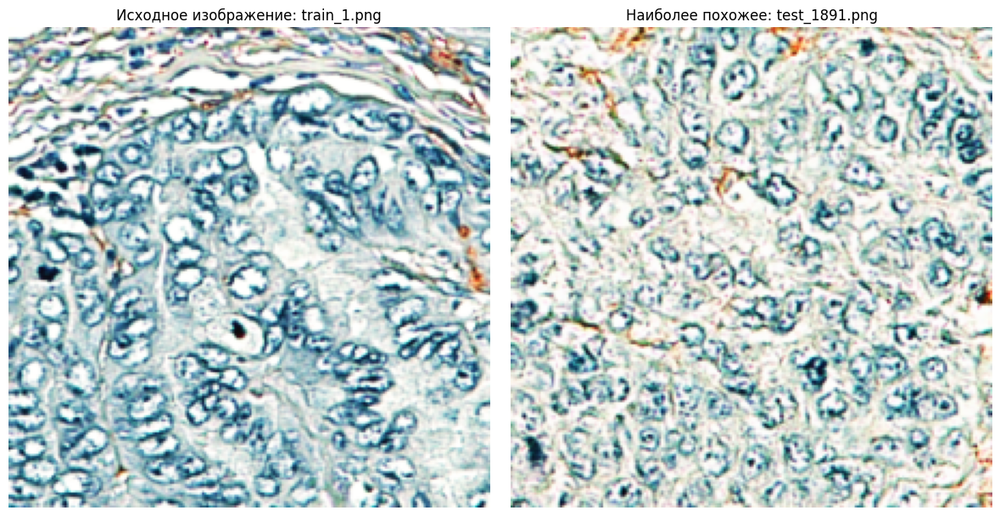

In [3]:
import matplotlib.pyplot as plt
import os
import cv2

def visualize_comparison(set1_path, set2_path, target_image_name, best_match_name):
    """Визуализирует исходное и найденное изображение"""
    target_path = os.path.join(set1_path, target_image_name)
    match_path = os.path.join(set2_path, best_match_name)

    target_img = cv2.imread(target_path)
    match_img = cv2.imread(match_path)

    target_img = cv2.cvtColor(target_img, cv2.COLOR_BGR2RGB)
    match_img = cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(target_img)
    ax1.set_title(f'Исходное изображение: {target_image_name}')
    ax1.axis('off')

    ax2.imshow(match_img)
    ax2.set_title(f'Наиболее похожее: {best_match_name}')
    ax2.axis('off')

    plt.tight_layout()
    plt.show()

# Визуализируем результат
visualize_comparison(set1_folder, set2_folder, target_image, best_match_resnet)

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim


def compute_similarity_mask(img1_path: str, img2_path: str):
    """
    Загружает два изображения, вычисляет карту сходства и бинарную маску максимального совпадения.

    Параметры:
        img1_path: путь к первому изображению
        img2_path: путь ко второму изображению

    Возвращает:
        similarity_map: карта сходства (от 0 до 1)
        match_mask: бинарная маска совпадения (0 или 255)
    """

    # --- 1. Загрузить изображения ---
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    if img1 is None:
        raise ValueError("Не удалось прочитать 1 изображение!")
    if img2 is None:
        raise ValueError("Не удалось прочитать 2 изображение!")

    # --- 2. Привести изображения к одному размеру ---
    h = min(img1.shape[0], img2.shape[0])
    w = min(img1.shape[1], img2.shape[1])

    img1 = cv2.resize(img1, (w, h))
    img2 = cv2.resize(img2, (w, h))

    # --- 3. Перевести в оттенки серого для SSIM ---
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # --- 4. Расчитать SSIM-карту сходства ---
    score, sim_map = ssim(gray1, gray2, full=True)
    # sim_map — значения от 0 до 1
    similarity_map = sim_map.astype(np.float32)

    # --- 5. Нормализация карты в диапазон 0–255 (для порогов) ---
    sim_norm = (similarity_map * 255).astype(np.uint8)

    # --- 6. Автоматический порог Otsu ---
    # Порог показывает область максимального совпадения
    _, match_mask = cv2.threshold(sim_norm, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    return similarity_map, match_mask


def visualize_mask(img1_path: str, img2_path: str, mask: np.ndarray, alpha: float = 0.5):
    """
    Показывает 4 изображения:
    1) Исходное изображение 1
    2) Исходное изображение 2
    3) Маска, наложенная на изображение 1
    4) Сама маска

    Параметры:
        img1_path: путь к изображению 1
        img2_path: путь к изображению 2
        mask: бинарная маска (0/255)
        alpha: прозрачность наложения маски
    """

    # --- Загрузка изображений ---
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    if img1 is None or img2 is None:
        raise ValueError("Не удалось прочитать одно из изображений!")

    # --- Приводим размеры изображений к маске ---
    h, w = mask.shape[:2]
    img1 = cv2.resize(img1, (w, h))
    img2 = cv2.resize(img2, (w, h))

    # --- Цветная маска (красная область) ---
    mask_color = np.zeros_like(img1)
    mask_color[:, :, 2] = mask

    # --- Наложение маски на изображение 1 ---
    overlay = cv2.addWeighted(img1, 1.0, mask_color, alpha, 0)

    # --- Отображение ---
    plt.figure(figsize=(12, 12))

    # 1 — Исходное изображение 1
    plt.subplot(2, 2, 1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title("Изображение 1")
    plt.axis("off")

    # 2 — Исходное изображение 2
    plt.subplot(2, 2, 2)
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.title("Изображение 2")
    plt.axis("off")

    # 3 — Маска, наложенная на изображение 1
    plt.subplot(2, 2, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title("Маска на изображении 1")
    plt.axis("off")

    # 4 — Сама бинарная маска
    plt.subplot(2, 2, 4)
    plt.imshow(mask, cmap="gray")
    plt.title("Маска совпадения")
    plt.axis("off")

    plt.tight_layout()
    plt.show()



In [15]:
import os
print(os.path.exists(set2_folder + '/' + best_match_resnet))

True


In [24]:
target_image = "train_8.png"
similarity_finder = ImageSimilarityFinder()
best_match_resnet, similarity_resnet = similarity_finder.find_most_similar(set1_folder, set2_folder, target_image)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


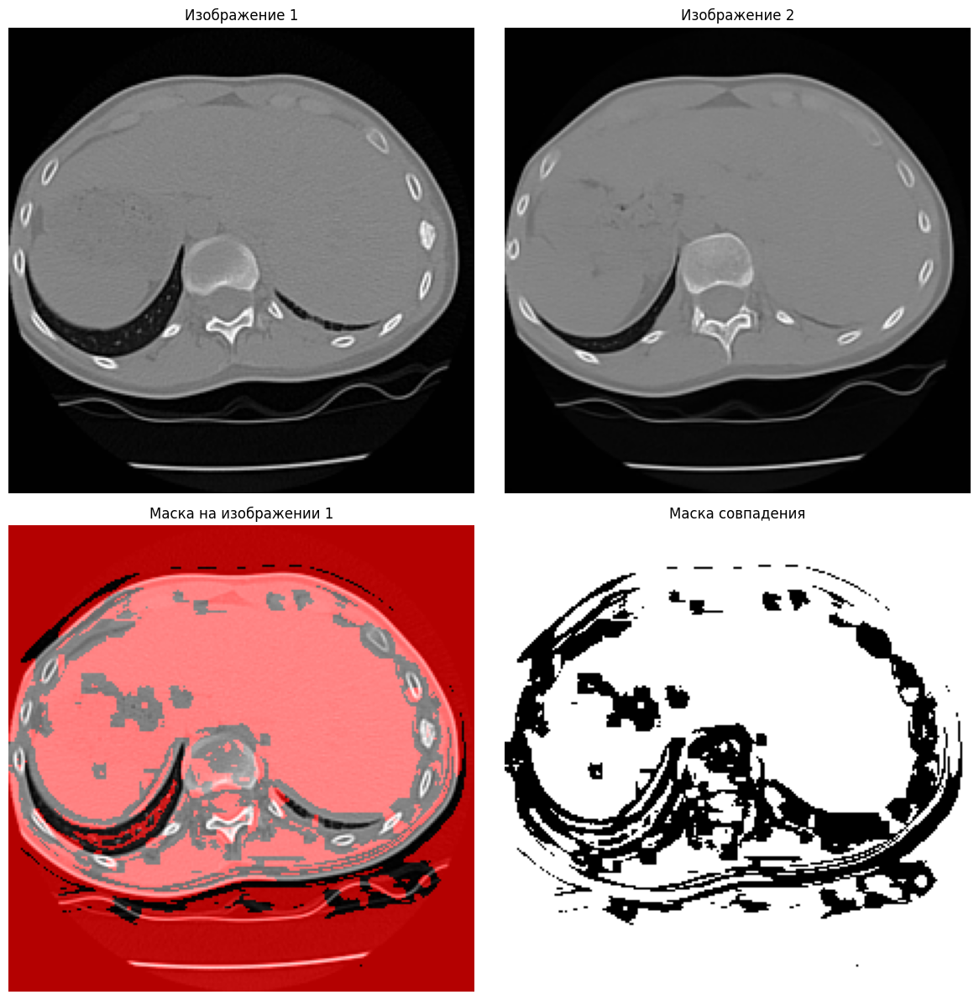

In [25]:
img1 = set1_folder + '/' + target_image
img2 = set2_folder + '/' + best_match_resnet

sim_map, mask = compute_similarity_mask(img1, img2)

visualize_mask(img1, img2, mask, alpha=0.7)

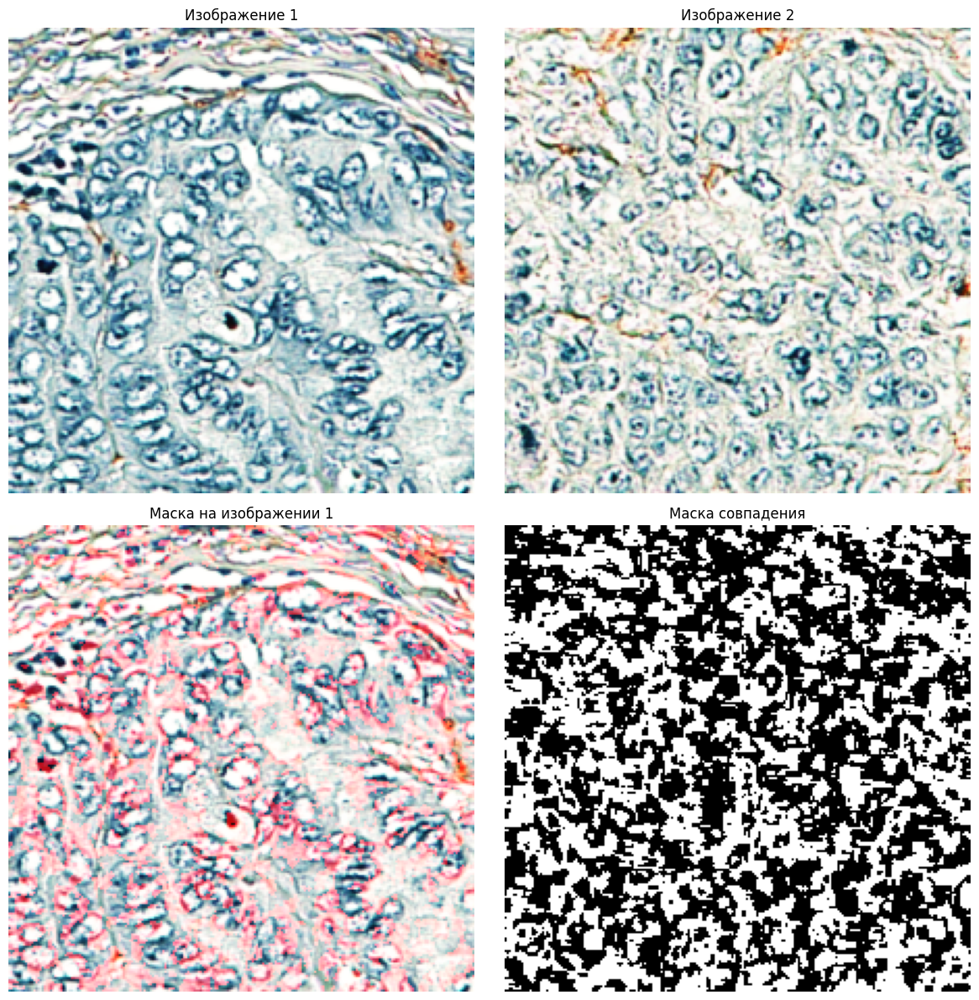

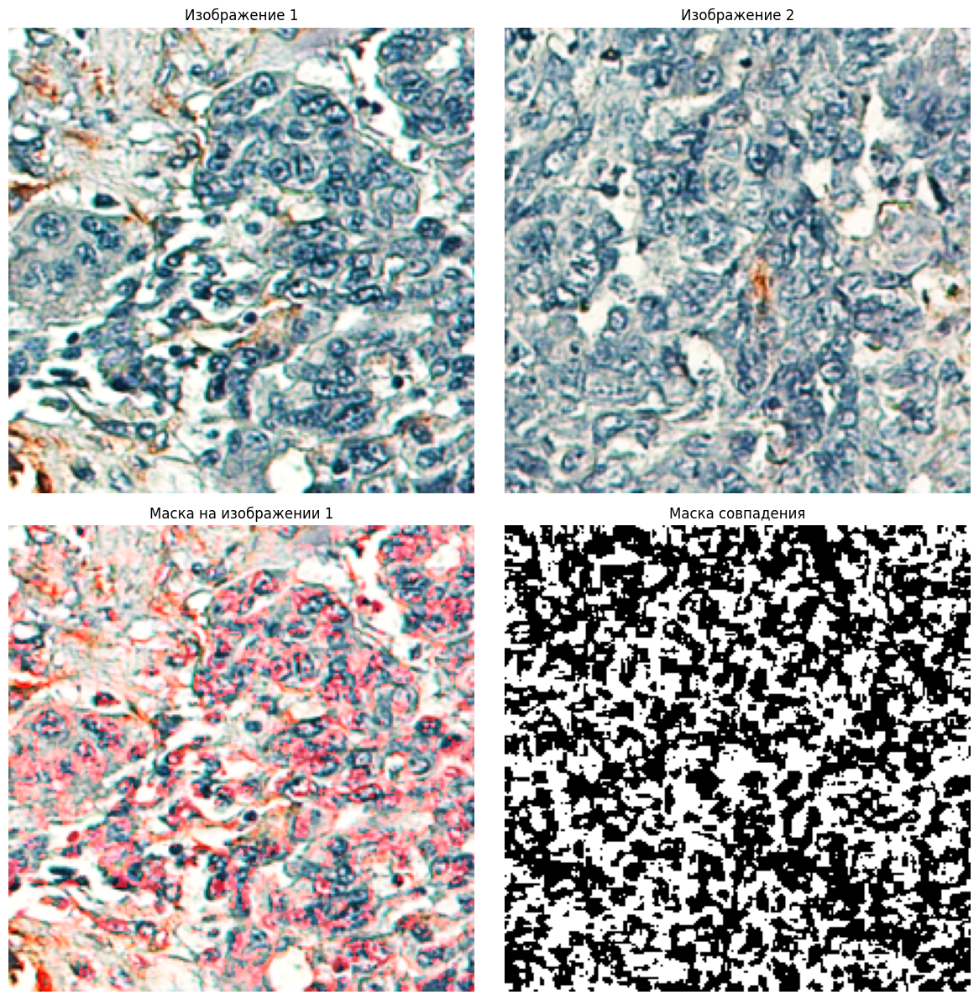

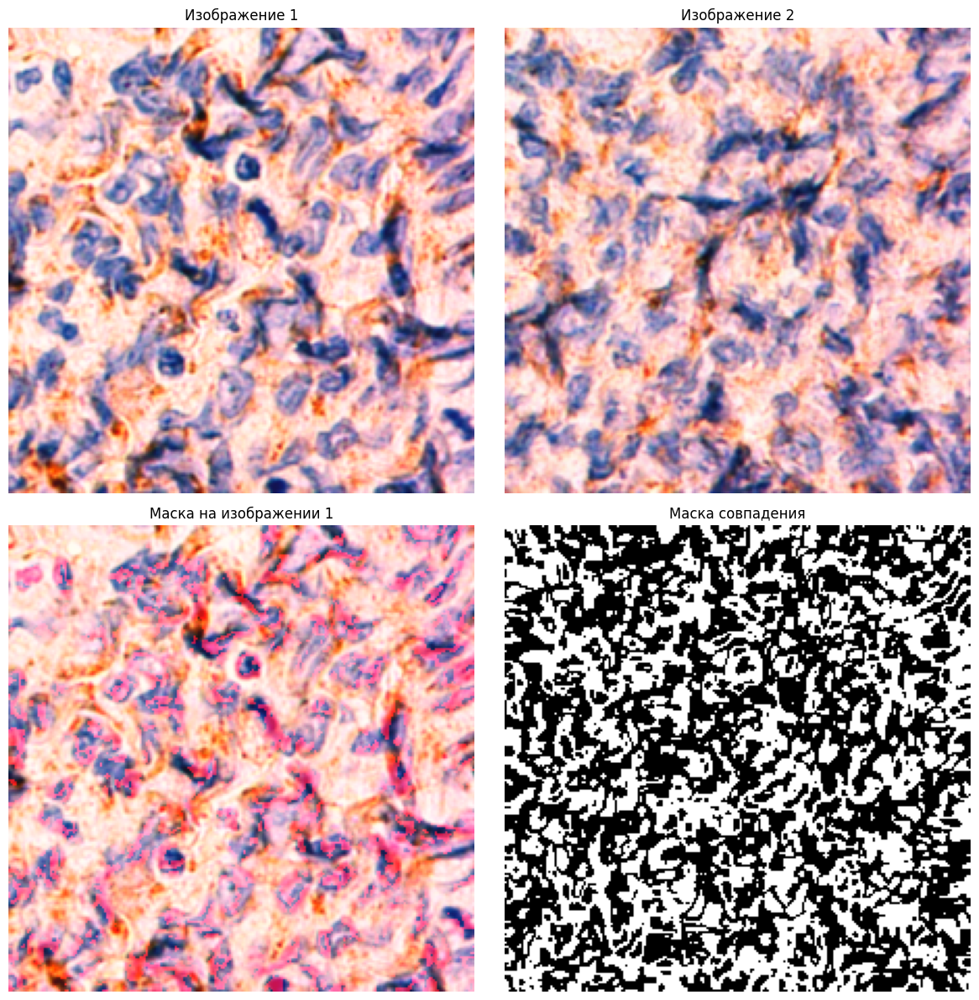

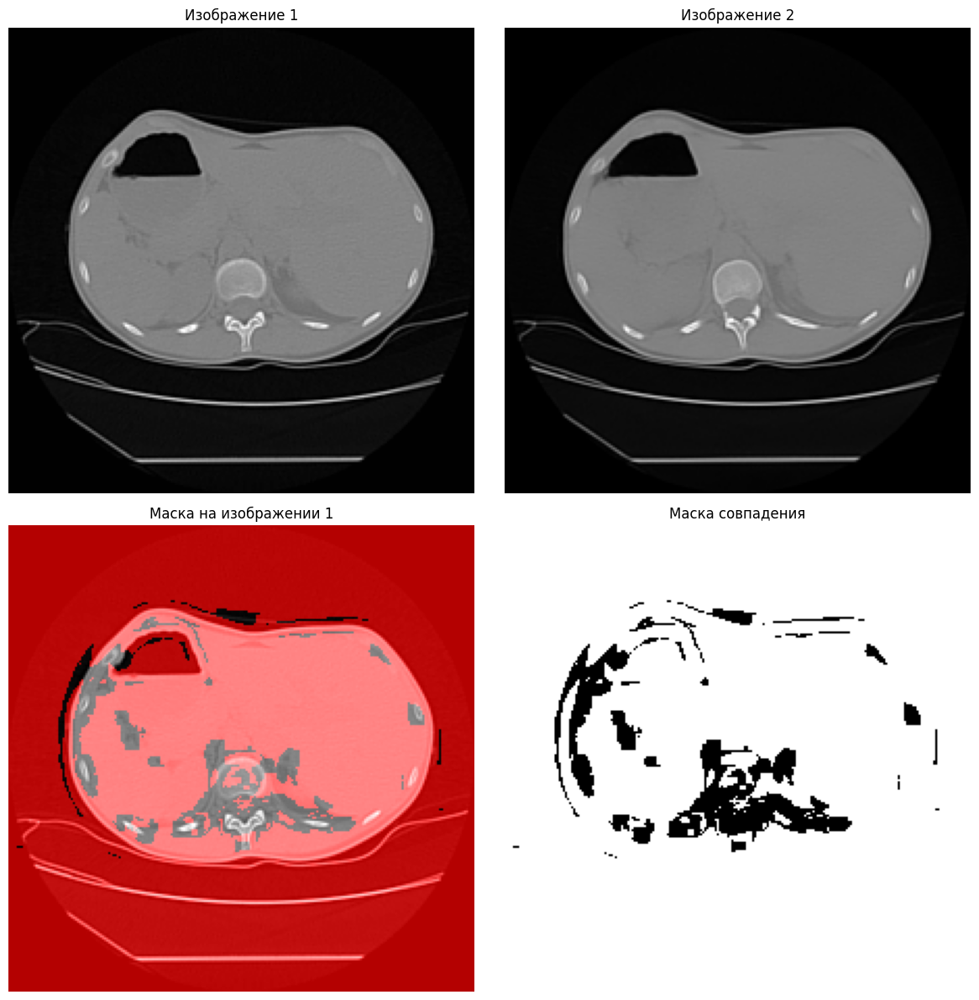

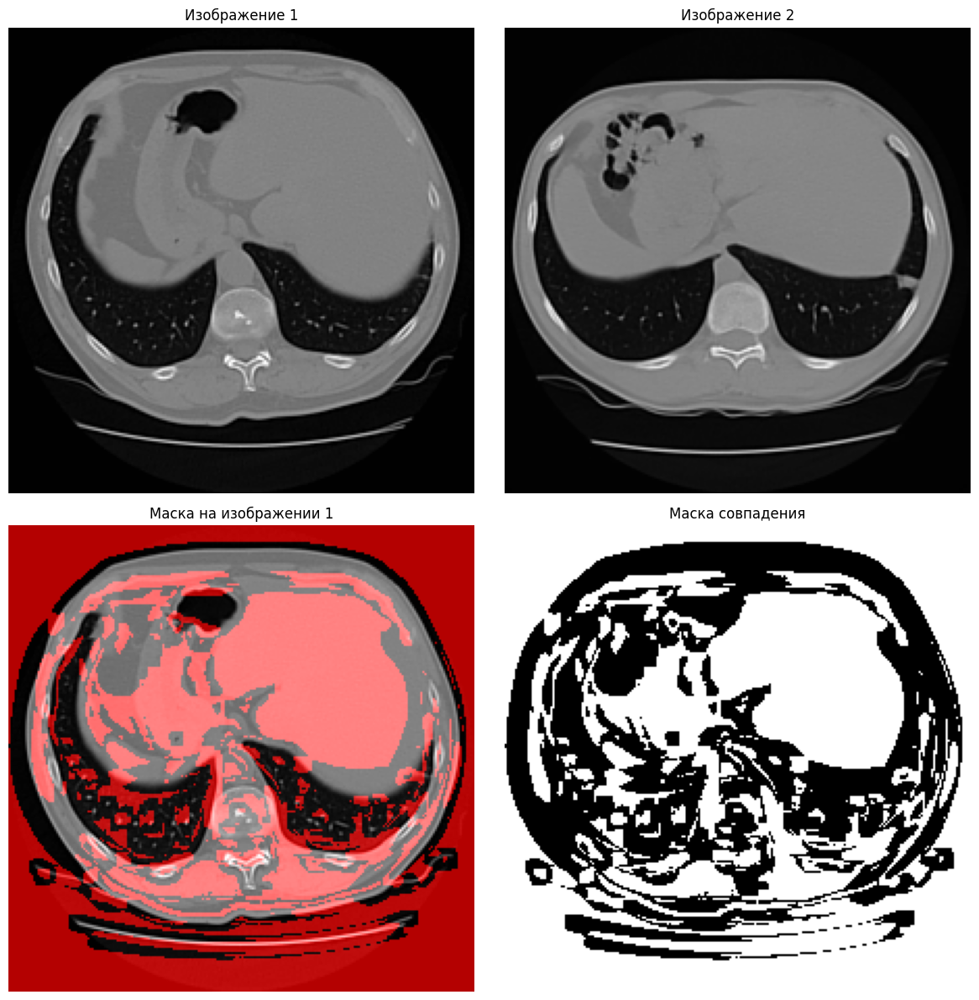

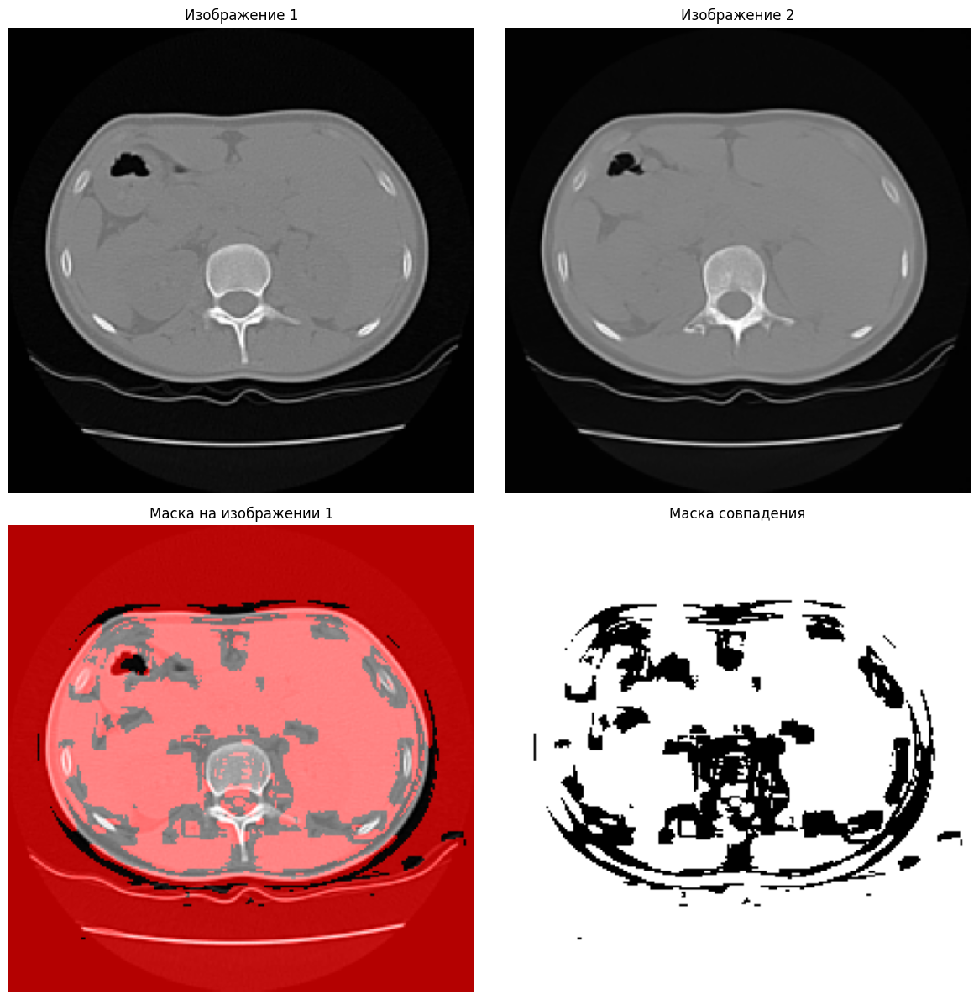

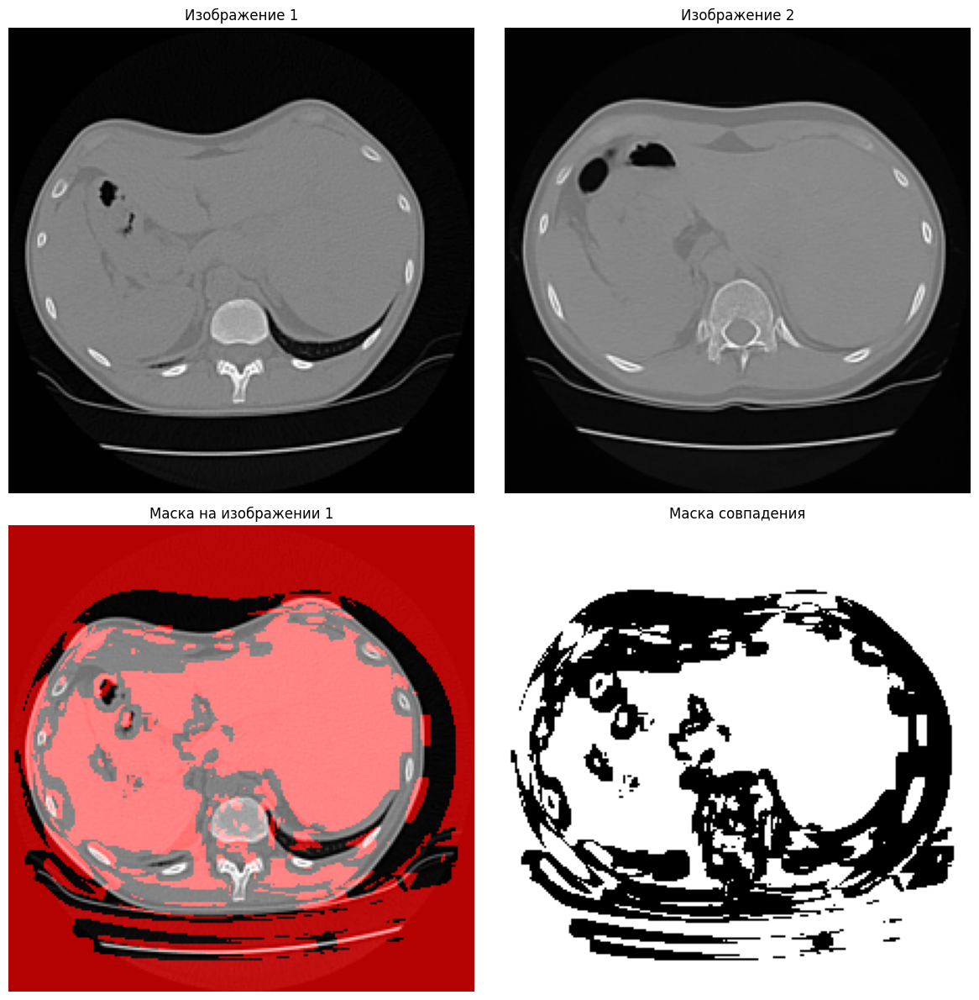

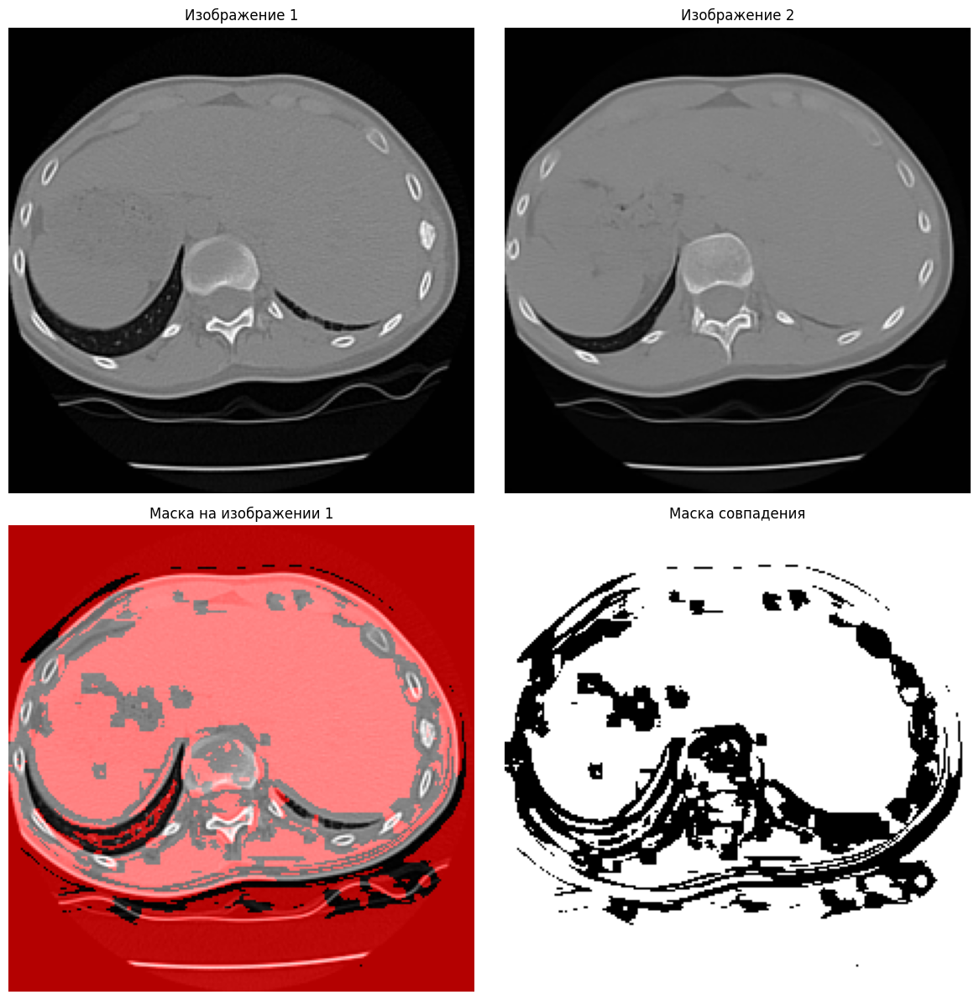

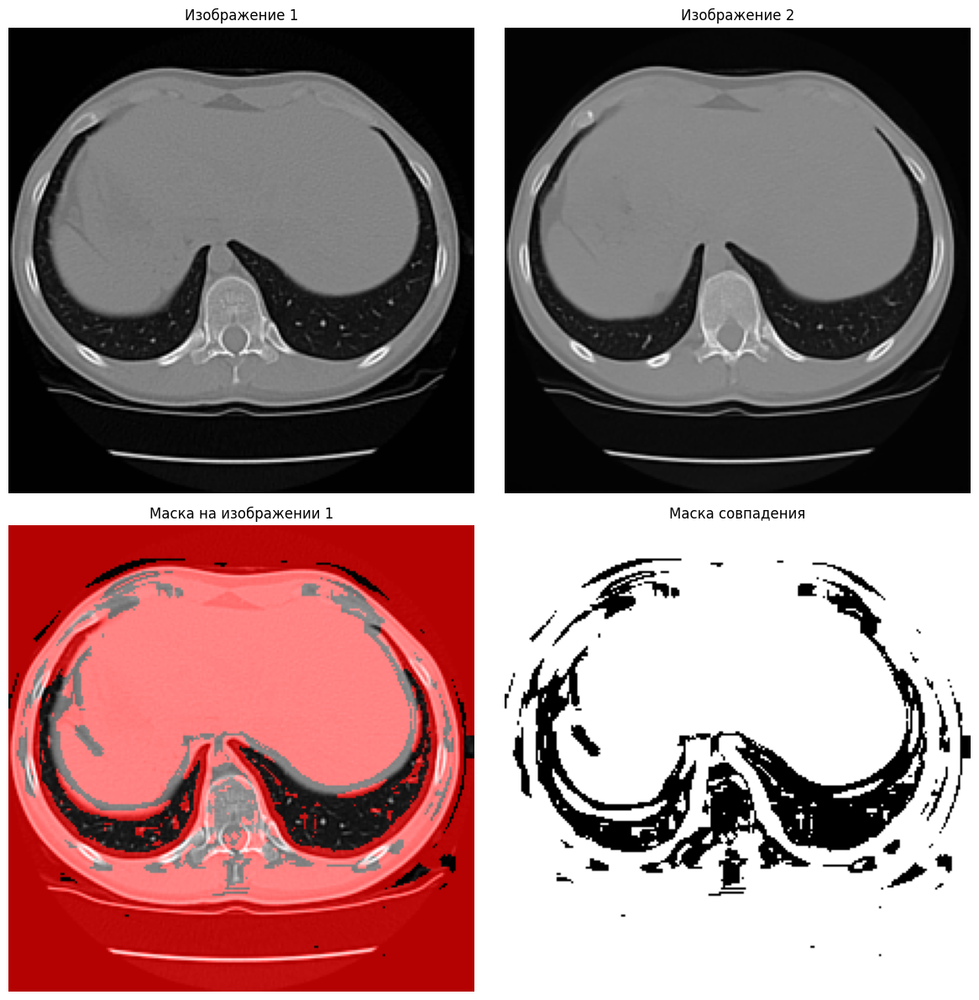

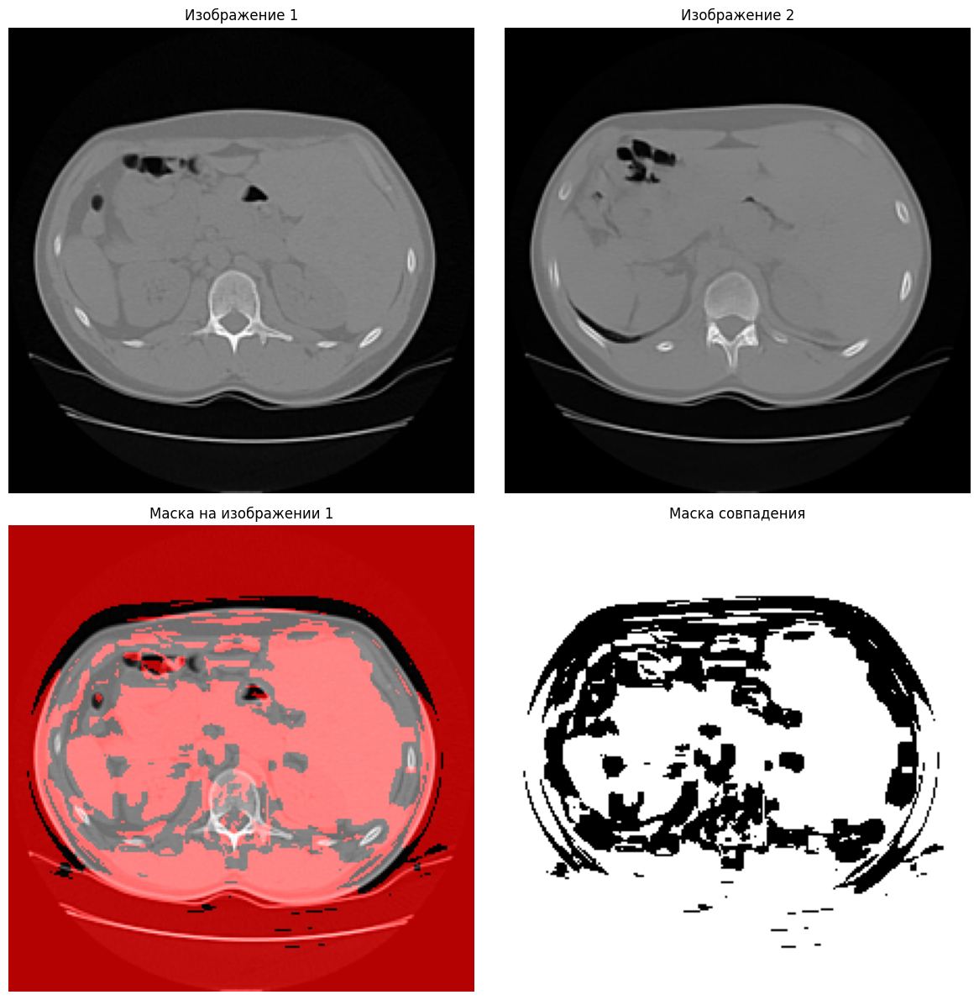

In [26]:
for i in range(1, 11):
  target_image = f'train_{i}.png'
  best_match_resnet, similarity_resnet = similarity_finder.find_most_similar(set1_folder, set2_folder, target_image)
  img1 = set1_folder + '/' + target_image
  img2 = set2_folder + '/' + best_match_resnet
  sim_map, mask = compute_similarity_mask(img1, img2)
  visualize_mask(img1, img2, mask, alpha=0.7)